# COVID-19 Dashboard: Insights and Trends

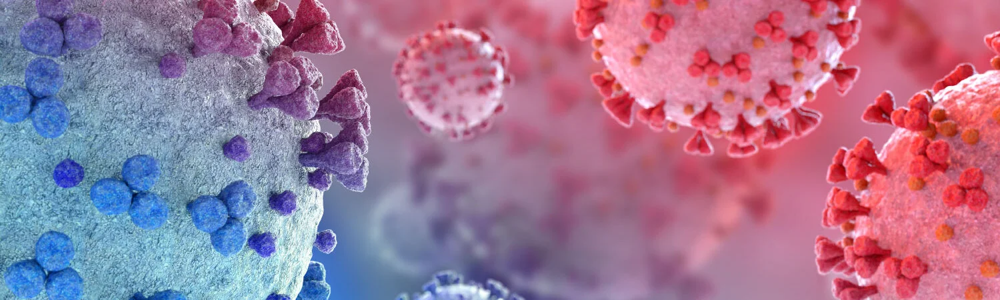

## Content
The data used in this project was scraped from woldometers.info on 2022-05-14 by Joseph Assaker. 225 countries are represented in this data. All of countries have records dating from 2020-2-15 until 2022-05-14 (820 days per country). 

That's with the exception of China, which has records dating from 2020-1-22 until 2022-05-14 (844 days per country), and Palau which has records dating from 2021-8-25 until 2022-05-14 (263 days per country).

### Explore all the essential information about COVID-19 covered in this notebook!
- What is COVID-19 ? 
- Loading Cleaned Data from woldometers.info
- Understanding the Trends of COVID-19 (World Statistics)
- Visualising by Continent
- Visualising by Country
- Comparing with population
- Understanding the COVID-19 Tends in INDIA
- Ploting all the graphs using Plotly
- Summary & Insights!

### What is COVID-19 ? 

The coronavirus disease COVID-19 is brought on by the SARS-CoV-2 virus. It spreads swiftly and can be extremely contagious. In the US, COVID-19 has claimed more over a million lives. Most frequently, COVID-19 causes respiratory symptoms that can resemble those of a cold, the flu, or pneumonia. COVID-19 may harm more than just your respiratory and pulmonary systems. The condition may also have an impact on other bodily components. The majority of COVID-19 patients experience moderate symptoms, but some develop severe illness.

In [1]:
#imported required libraries and load the dataset.
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [2]:
# Load the dataset
data=pd.read_csv("cleaned_worldometer_coronavirus_daily_data.csv")

In [3]:
smrydata=pd.read_csv("cleaned_worldometer_coronavirus_summary_data.csv")

In [4]:
# total number of confirmed, death
confirmed_total = int(smrydata['total_confirmed'].sum())
deaths_total = int(smrydata['total_deaths'].sum())
recovered_total = int(smrydata['total_recovered'].sum())

## World COVID-19 Statistics

In [5]:
trace = go.Pie(labels=['Total Recovered', 'Total Active', 'Total Deaths'],
               values=[smrydata.total_recovered.sum(), smrydata.active_cases.sum(), smrydata.total_deaths.sum()], 
               title="<b>Coronavirus Cases</b>",
               title_font_size=18,
               hovertemplate="<b>%{label}</b><br>%{value}<br><i>%{percent}</i>",
               #hoverinfo='percent+value+label', 
               textinfo='percent',
               textposition='inside',
               hole=0.6,
               showlegend=True,
               marker=dict(colors=["#8dd3c7", "ffffb3", "#fb8072"],
                           
                          ),
               name=""
              )
fig=go.Figure(data=[trace])
fig.show()

Out of all the reported cases, 1.31% of cases ended with death, 95.8% of the cases ended with recoveries, and 2.91% are still active cases currently. While a 1.31% death rate may seem low, the actual number of lives lost is staggering, with over 6 million reported deaths.

In [6]:
import plotly.graph_objs as go
import pandas as pd
# Convert date column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Group data by date and calculate daily new deaths
daily_new_cases = data.groupby('date')['daily_new_cases'].sum()

# Create line graph
fig = go.Figure(go.Scatter(
    x=daily_new_cases.index,
    y=daily_new_cases.values,
    mode='lines',
    line=dict(color='forestgreen'),
))
fig.update_layout(
    title='WORLD - Daily New COVID-19 Cases by Date',
    xaxis_title='Date',
    yaxis_title='New Cases',
    width=900,
    height=400,
)
fig.show()

# Calculate summary statistics
total_cases = data['cumulative_total_cases'].max()
avg_daily_new_cases = daily_new_cases.mean()

# Print summary statistics
print(f'Total cases: {total_cases}')
print(f'Average daily new cases: {avg_daily_new_cases}')

Total cases: 84209473.0
Average daily new cases: 617098.4869668246


In [7]:
# Convert date column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Group data by date and calculate daily new deaths
daily_new_deaths = data.groupby('date')['daily_new_deaths'].sum()

# Create line graph
fig = go.Figure(go.Scatter(
    x=daily_new_cases.index,
    y=daily_new_cases.values,
    mode='lines',
    line=dict(color='red'),
))
fig.update_layout(
    title='WORLD - Daily New COVID-19 Deaths',
    xaxis_title='Date',
    yaxis_title='New Deaths',
    width=900,
    height=400,
)
fig.show()

# Calculate summary statistics
total_deaths = data['cumulative_total_deaths'].max()
avg_daily_new_deaths = daily_new_deaths.mean()

# Print summary statistics
print(f'Total deaths: {total_deaths}')
print(f'Average daily new deaths: {avg_daily_new_deaths}')

Total deaths: 1026646.0
Average daily new deaths: 7449.591232227488


The COVID-19 pandemic is still ongoing, with a high average of daily new cases and deaths.

## Visualizing by Continent

In [8]:
import plotly.express as px
import plotly.graph_objs as go

# create a row of plots
fig = px.histogram(smrydata, x='continent', y=['total_confirmed', 'total_deaths', 'total_recovered', 'serious_or_critical'],
             barmode='group')

# update axis labels and title
fig.update_xaxes(title_text='Continent')
fig.update_yaxes(title_text='Number of People')
fig.update_layout(title='World COVID-19 Summary by Continent')

# show the figure
fig.show()

In [9]:
# Create a bubble chart to visualize the relationship between active cases, continent, and population
fig = px.scatter(smrydata, x='continent', y='active_cases', 
                 size='population', color='continent', 
                 hover_data=['country'], 
                 title='Active COVID-19 Cases by Continent',
                 labels={'active_cases': 'Active Cases', 'continent': 'Continent'})

# Show the plot
fig.show()

It appears that Asia has the highest number of active COVID-19 cases, followed by Europe. This could be due to a variety of factors, such as population density, travel patterns, and healthcare infrastructure.

In [10]:
import pandas as pd
import plotly.express as px

# Group the data by country and continent
grouped = smrydata.groupby(['country', 'continent']).sum().reset_index()

# Create a scatter plot of total confirmed cases by continent
fig1 = px.scatter(smrydata, x='total_confirmed', y='continent', color='continent',
                  hover_name='continent', log_x=True,
                 title='Total Confirmed Cases by Continent')
fig1.update_layout(xaxis_title='Total Confirmed Cases', yaxis_title='Continent')
fig1.update_xaxes(range=[2, 9])

# Create a scatter plot of total deaths by continent
fig2 = px.scatter(smrydata, x='total_deaths', y='continent', color='continent',
                  hover_name='continent', log_x=True,
                 title='Total Deaths by Continent')
fig2.update_layout(xaxis_title='Total Deaths', yaxis_title='Continent')
fig2.update_xaxes(range=[0, 4])

# Show the plots
fig1.show()
fig2.show()

# Group the data by continent and sum the total confirmed cases and deaths
grouped = smrydata.groupby('continent')[['total_confirmed', 'total_deaths']].sum()

# Sort the data in ascending order by total confirmed cases and deaths
sorted_data = grouped.sort_values(['total_confirmed', 'total_deaths'], ascending=False)

# Print the results
print(sorted_data)

                   total_confirmed  total_deaths
continent                                       
Europe                   194330079     1830655.0
Asia                     149999659     1427939.0
North America             99625662     1467234.0
South America             57136485     1296523.0
Africa                    12042400      254319.0
Australia/Oceania          7942867       11413.0


The continent with the highest total confirmed cases is Europe with 194,330,079 cases, which is 44,330,420 more than the second highest continent.
The continent with the highest total deaths is Europe with 1,830,655.0 deaths, which is 363421.0 more than the second highest continent.

In [11]:
# Calculate the percentage of people who took the Covid-19 test in each continent
smrydata['test_percentage'] = (smrydata['total_tests'] / smrydata['population']) * 100

# Create a bar chart to visualize the percentage of people who took the Covid-19 test in each continent
fig = px.scatter(smrydata, x='continent', y='test_percentage', 
             color_discrete_sequence=['#1f77b4'], 
             title='Percentage of People Who Took the Covid-19 Test in Each Continent',
             labels={'value': 'Percentage', 'continent': 'Continent'})

# Show the plot
fig.show()

# calculate the percentage of people who took the Covid-19 test in each continent
smrydata['percentage_took_test'] = (smrydata['total_tests'] / smrydata['population']) * 100

# find the continent with the highest percentage of people who took the Covid-19 test
continent_with_highest_percentage = smrydata.loc[smrydata['percentage_took_test'].idxmax(), 'continent']

# find the percentage of people who took the Covid-19 test in the continent with the highest percentage
highest_percentage = smrydata.loc[smrydata['percentage_took_test'].idxmax(), 'percentage_took_test']

# calculate the difference between the highest percentage and the average percentage across all continents
average_percentage = smrydata['percentage_took_test'].mean()
difference = highest_percentage - average_percentage

print("The continent with the highest percentage of people who took the Covid-19 test is", 
      continent_with_highest_percentage, "by", round(difference, 2), "percentage points.")

The continent with the highest percentage of people who took the Covid-19 test is Europe by 1989.78 percentage points.


## Visualizing by Country

In [12]:
import plotly.express as px
fig = px.line(data, x='cumulative_total_cases', y='cumulative_total_deaths', color='country', 
              hover_name='country', log_x=True, log_y=True, title='COVID-19 Cases and Deaths by Country')
fig.show()

USA has the highest number of cumulative total cases and deaths, followed by India and Brazil. Additionally, the number of cases and deaths in each country is increasing over time.

In [13]:
# Create a bar chart of the top 10 countries by total confirmed cases per 1M population
top_10 = smrydata.sort_values('total_cases_per_1m_population', ascending=False).iloc[:10]
fig = px.bar(top_10, x='country', y='total_cases_per_1m_population',
             title='Top 10 Countries by Total Confirmed Cases per 1M Population')
fig.show()

# Create a bar chart of the top 10 countries by total confirmed cases per 1M population
least_10 = smrydata.sort_values('total_deaths_per_1m_population', ascending=False).iloc[:10]
fig = px.bar(least_10, x='country', y='total_deaths_per_1m_population',
             title='Top 10 Countries by Total Confirmed Deaths per 1M Population')
fig.show()

In [14]:
# Calculate the total number of cases, deaths, and recoveries by country
country_data = smrydata.groupby(['country']).agg({'total_confirmed': 'sum', 'total_deaths': 'sum', 'total_recovered': 'sum'})

# Calculate the number of active cases by country
country_data['active_cases'] = country_data['total_confirmed'] - country_data['total_deaths'] - country_data['total_recovered']

# Sort the data by the number of active cases and select the top 5 countries
top_5 = country_data.sort_values(by='active_cases', ascending=False).head(5)

# Reset the index to include the country as a column
top_5.reset_index(inplace=True)

# Create a bar chart using Plotly
fig = px.bar(data_frame=top_5,
             x='country',
             y='active_cases',
             title='Top 5 Countries with the Highest Number of Active COVID-19 Cases')

fig.show()

South Korea has the highest number of active cases. This means that South Korea has not yet recovered from the pandemic and is still experiencing a high number of cases. We can also use this information to identify areas where additional resources and support may be needed to help combat the spread of the virus. This could include medical supplies, personnel, and funding. By providing these resources, we can help the country to reduce the number of cases and eventually recover from the pandemic. 

## Comparison by Population

In [15]:
# Create a scatter plot to visualize the relationship between serious or critical cases and population
fig = px.scatter(smrydata, x='population', y='serious_or_critical', 
                 title='Serious or Critical Cases vs Population', 
                 hover_data=['country'], 
                 log_x=True, log_y=True, 
                 color_discrete_sequence=px.colors.qualitative.Light24)

# Show the plot
fig.show()

In [16]:
# Create a scatter plot to visualize the relationship between serious or critical cases and population
fig = px.scatter(smrydata, x='population', y='total_recovered', 
                 title='Total Recovered vs Population', 
                 hover_data=['country'], 
                 log_x=True, log_y=True, 
                 color_discrete_sequence=px.colors.qualitative.Dark2)

# Show the plot
fig.show()

The vast majority of people who have contracted the disease in India have recovered, which is a positive sign. Additionally, the percentage of serious cases is very small, which suggests that the overall situation is not as severe as it could be. However, it is important to continue taking precautions and following guidelines to prevent the spread of the disease.

# COVID-19 Trends in INDIA

In [17]:
import plotly.graph_objects as go
import pandas as pd

# Filter data for India
india_data = smrydata[smrydata['country'] == 'India']

# Create a pie chart showing the distribution of cases
fig = go.Figure(data=[go.Pie(labels=['Active', 'Recovered', 'Deceased','Serious/Critical'],
                             values=[india_data['active_cases'].iloc[0], india_data['total_recovered'].iloc[0], 
                                     india_data['total_deaths'].iloc[0],india_data['serious_or_critical'].iloc[0]],
                             hole=.6,pull=[0, 0, 0, 0])])

# Set chart title
fig.update_layout(title="India's COVID-19 Summary")

# Show chart
fig.show()

# Calculate the percentage of cases for each metric
active_percent = round(india_data['active_cases'].iloc[0] / india_data['total_confirmed'].iloc[0] * 100, 2)
recovered_percent = round(india_data['total_recovered'].iloc[0] / india_data['total_confirmed'].iloc[0] * 100, 2)
deaths_percent = round(india_data['total_deaths'].iloc[0] / india_data['total_confirmed'].iloc[0] * 100, 2)
serious_or_critical_percent = round(india_data['serious_or_critical'].iloc[0] / india_data['total_confirmed'].iloc[0] * 100, 2)

# Create a table showing the summary data
fig = go.Figure(data=[go.Table(header=dict(values=['Metric', 'Value', 'Percentage']),
                 cells=dict(values=[['Active', 'Recovered', 'Deaths','Serious/Critical'], 
                                     [india_data['active_cases'].iloc[0], india_data['total_recovered'].iloc[0], 
                                      india_data['total_deaths'].iloc[0], india_data['serious_or_critical'].iloc[0]],
                                     [f'{active_percent}%', f'{recovered_percent}%', f'{deaths_percent}%', 
                                      f'{serious_or_critical_percent}%']]))])

# update the layout to remove the axis and title and set the background to transparent
fig.update_layout(xaxis=dict(visible=False), yaxis=dict(visible=False),
                  plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')

fig.show()

The majority of people who have contracted COVID-19 in India have recovered, and only a small percentage of cases are still active. The percentage of serious/critical cases is also very low.

In [18]:
# Filter data for India
df_india = data[data['country'] == 'India']

# Create traces for each case type
trace_confirmed = go.Bar(x=df_india['date'], y=df_india['cumulative_total_cases'], name='Confirmed')
trace_deaths = go.Scatter(x=df_india['date'], y=df_india['cumulative_total_deaths'], name='Deaths')

# Create figure layout
layout = go.Layout(title='COVID-19 Cases in India', xaxis_title='Date', yaxis_title='Number of cases')

# Create figure object
fig = go.Figure(data=[trace_confirmed, trace_deaths], layout=layout)

# Show plot
fig.show()

Select a particular area to see closer

In [19]:
# Create a bar chart comparing Total cases per 1M population for each country/region
fig = go.Figure(data=[go.Bar(name='Total cases per 1M population', x=smrydata['country'], 
                             y=smrydata['total_cases_per_1m_population'])
])

# Set chart title and axis labels
fig.update_layout(title='Comparison of Total cases per 1M population for India and other countries/regions',
                   xaxis_title='Country/Region',
                   yaxis_title='Total cases per 1M population')

# Show chart
fig.show()

In comparison with other countries and regions, India has 30,686 confirmed cases of COVID-19 per one million people in the population which is comparitively low.

In [20]:
# Filter data for India
india_data = smrydata[smrydata['country'] == 'India']

# Calculate the percentage of people who have taken COVID-19 tests in India
tested_percent = round(india_data['total_tests'].iloc[0] / india_data['population'].iloc[0] * 100, 2)

# Define labels, values, and colors for the pie chart
labels = ['Tested', 'Not Tested']
values = [tested_percent, 100 - tested_percent]
colors = ['#1f77b4', '#ff7f0e']

# Create a pie chart showing the percentage of people who have taken COVID-19 tests in India
fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='percent', 
                             marker=dict(colors=colors))])

# Set chart title
fig.update_layout(title='Percentage of People Tested for COVID-19 in India')

# Show chart
fig.show()

A significant portion of the population in India has not been tested for COVID-19. This means that the actual number of COVID-19 cases in India may be higher than what has been reported, since many people who have the virus may not have been tested and identified. 

It is important to increase testing rates in order to get a more accurate picture of the spread of the virus and to take appropriate measures to control it.

The vast majority of people who have contracted the disease in India have recovered, which is a positive sign. Additionally, the percentage of serious cases is very small, which suggests that the overall situation is not as severe as it could be. However, it is important to continue taking precautions and following guidelines to prevent the spread of the disease.

# Summary
In this project, we did Exploratory Data Analysis on Covid 19 is to gain insights and understanding about the data related to Covid 19 which helps in identifying trends, patterns, and relationships between different variables in the data.

- Europe has been hit particularly hard by Covid 19, with many countries experiencing high numbers of cases and deaths. 
- In the United States, the number of Covid 19 cases and deaths has been high.
- In Africa, the number of Covid 19 cases and deaths has been relatively low compared to other continents, but there have been concerns about underreporting due to limited testing and healthcare resources.
- In Asia, the situation has varied widely between countries. 
- In South America, the number of Covid 19 serious/critical cases has been high, with Brazil being one of the most affected countries.

## Insights!
- The number of confirmed cases and deaths has been higher in some countries than others. For example, the United States, Brazil, and India have had some of the highest numbers of confirmed cases and deaths.
- The rate of increase in cases and deaths has varied across countries and continents. Some countries have experienced a rapid increase in cases and deaths, while others have been able to flatten the curve more effectively.
- The effectiveness of different public health interventions, such as lockdowns and social distancing measures, can vary across countries and regions.
- The availability and effectiveness of Covid-19 testing and contact tracing can affect the ability of countries to control the spread of the virus.


### -- Project Submitted by MERLYN JOHN (MSc.Computer Science final year)